In [1]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
import random as rn
import os
from numpy.random import seed

# Making examples reproducible
seed(2)
tf.random.set_seed(2)
os.environ['PYTHONHASHSEED'] = str(2)
rn.seed(2)

In [3]:
# Should work since TF 2.8 to set the Numpy, Keras/TF and OS-level seed
# and enable determinism even on a GPU
# Though, it doesn't work on all machines.

# tf.keras.utils.set_random_seed(1)
# tf.config.experimental.enable_op_determinism()

In [3]:
# Removing annoying non-relevant warnings
# such upcoming API changes that we don't call
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [7]:
! kaggle datasets download -d puneet6060/intel-image-classification


  0%|          | 0.00/346M [00:00<?, ?B/s]
  1%|          | 2.00M/346M [00:00<00:20, 17.3MB/s]
  1%|1         | 5.00M/346M [00:00<00:17, 20.8MB/s]
  2%|2         | 8.00M/346M [00:00<00:17, 20.8MB/s]
  3%|3         | 11.0M/346M [00:00<00:15, 23.4MB/s]
  4%|4         | 14.0M/346M [00:00<00:14, 23.7MB/s]
  5%|4         | 17.0M/346M [00:00<00:14, 24.1MB/s]
  6%|5         | 20.0M/346M [00:00<00:14, 24.3MB/s]
  7%|6         | 23.0M/346M [00:01<00:13, 25.0MB/s]
  8%|7         | 26.0M/346M [00:01<00:13, 25.0MB/s]
  8%|8         | 29.0M/346M [00:01<00:12, 25.8MB/s]
  9%|9         | 32.0M/346M [00:01<00:13, 25.3MB/s]
 10%|#         | 35.0M/346M [00:01<00:12, 25.5MB/s]
 11%|#         | 38.0M/346M [00:01<00:12, 25.1MB/s]
 12%|#1        | 41.0M/346M [00:01<00:12, 25.9MB/s]
 13%|#2        | 44.0M/346M [00:01<00:12, 25.6MB/s]
 14%|#3        | 47.0M/346M [00:02<00:12, 25.4MB/s]
 14%|#4        | 50.0M/346M [00:02<00:12, 24.7MB/s]
 15%|#5        | 53.0M/346M [00:02<00:13, 23.6MB/s]
 16%|#6        | 56.

In [8]:
import os
import zipfile

if not os.path.exists('./intel-image-classification/'):
    with zipfile.ZipFile("intel-image-classification.zip","r") as zip_ref:
        zip_ref.extractall("intel-image-classification")

In [9]:
for filename in os.listdir('intel-image-classification'):
    print(filename)

seg_pred
seg_test
seg_train


In [10]:
ROOT_PATH = 'intel-image-classification'

config = {
    'TRAIN_PATH': ROOT_PATH + '/seg_train/seg_train/',
    'TEST_PATH': ROOT_PATH + '/seg_test/seg_test/',
    'PRED_PATH': ROOT_PATH + '/seg_pred/seg_pred/'
}

classnames=['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

In [11]:
for filename in os.listdir(config['TRAIN_PATH']):
    print(filename)

buildings
forest
glacier
mountain
sea
street


In [13]:
for dirname in os.listdir(config['TRAIN_PATH']):
    print(f"Path: \'{dirname}\', Length: {len(os.listdir(config['TRAIN_PATH']+dirname))}")

Path: 'buildings', Length: 2191
Path: 'forest', Length: 2271
Path: 'glacier', Length: 2404
Path: 'mountain', Length: 2512
Path: 'sea', Length: 2274
Path: 'street', Length: 2382


In [14]:
training_images_sum = 0
for filename in os.listdir(config['TRAIN_PATH']):
    training_images_sum=training_images_sum+ len(os.listdir(config['TRAIN_PATH']+filename))
print(f'Number of training examples: {training_images_sum}')

testing_images_sum = 0
for filename in os.listdir(config['TEST_PATH']):
    testing_images_sum=testing_images_sum+ len(os.listdir(config['TEST_PATH']+filename))
print(f'Number of testing examples: {testing_images_sum}')

Number of training examples: 14034
Number of testing examples: 3000


In [15]:
def display_images(class_name, subset):
    if subset == 'train':
        directory = f"{config['TRAIN_PATH']+class_name}"
    else:
        directory = f"{config['TEST_PATH']+class_name}"
        
    fig = plt.figure(figsize=(10, 10))
       
    for index, img_path in enumerate(os.listdir(directory)[:25]):
        img = plt.imread(f'{directory}/{img_path}')
        ax = fig.add_subplot(5, 5, index+1)
        ax.imshow(img)
        ax.axis('off')
        
    plt.tight_layout()
    plt.show()

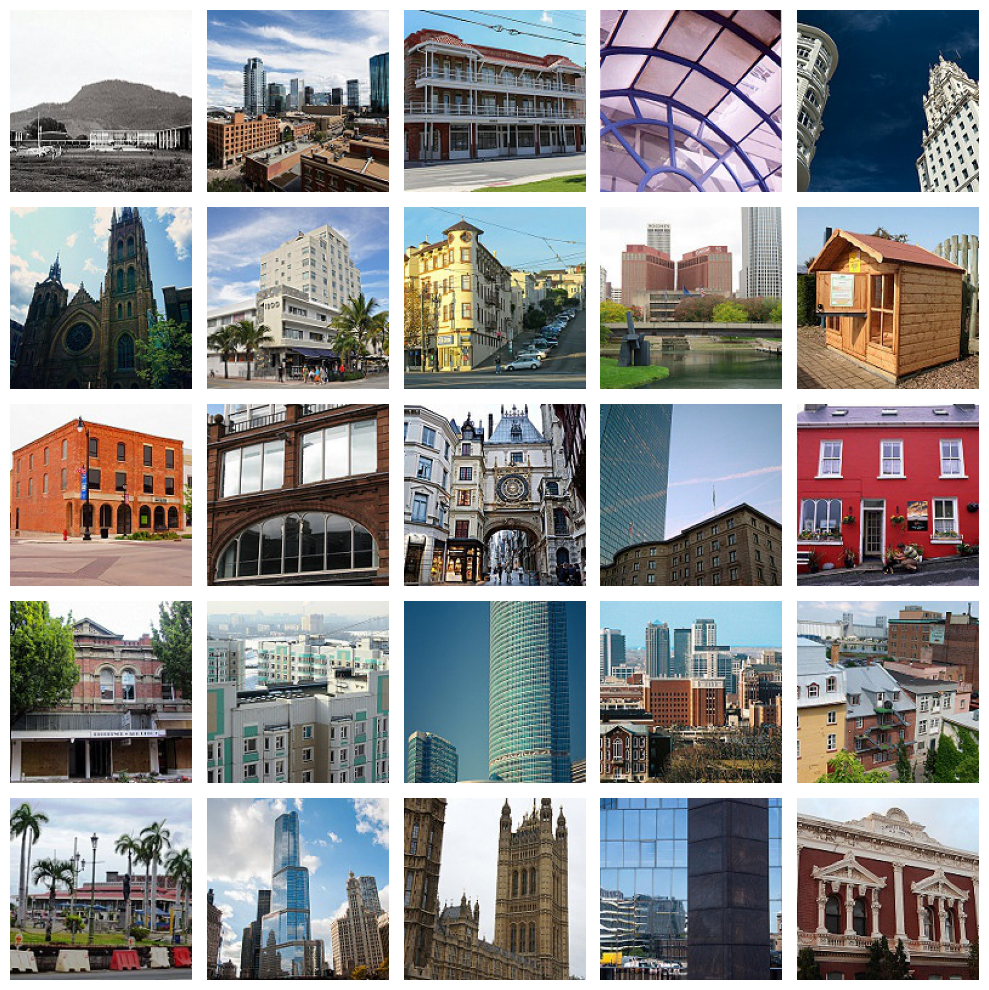

In [16]:
display_images('buildings','train')

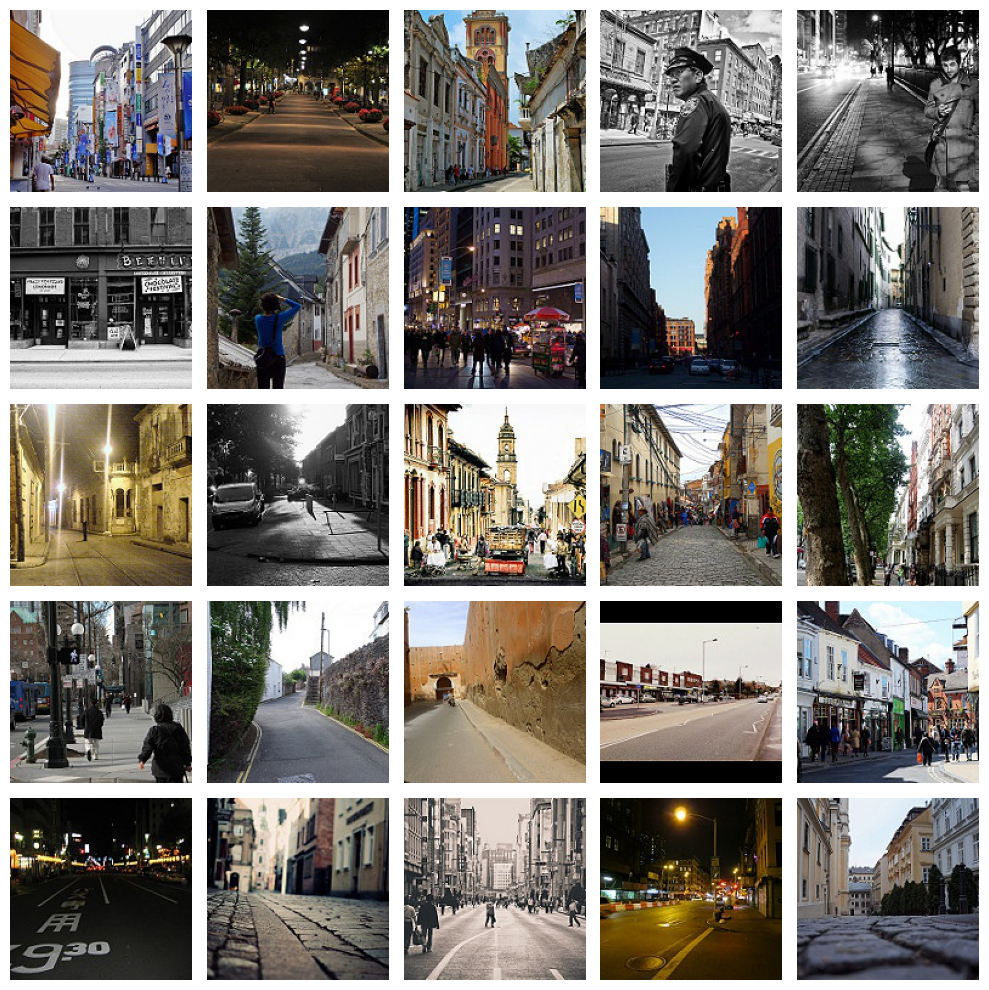

In [17]:
display_images('street','train')

In [18]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1./255, 
        rotation_range=20,
        zoom_range=0.15,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.15,
        horizontal_flip=True,
        fill_mode="nearest", 
        validation_split=0.2)

test_datagen = ImageDataGenerator(rescale=1./255)

In [19]:
train_generator = train_datagen.flow_from_directory(config['TRAIN_PATH'],
                                                  target_size=(150,150),
                                                  batch_size=32,
                                                  class_mode='categorical', 
                                                  subset='training',
                                                  seed=2)

valid_generator = train_datagen.flow_from_directory(config['TRAIN_PATH'], 
                                                   target_size=(150,150),
                                                   batch_size=32,
                                                   class_mode='categorical', 
                                                   subset='validation',
                                                   seed=2)

test_generator = test_datagen.flow_from_directory(config['TEST_PATH'],
                                                 target_size=(150,150),
                                                 batch_size=32,
                                                 shuffle=False,
                                                 class_mode='categorical',
                                                 seed=2)

Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


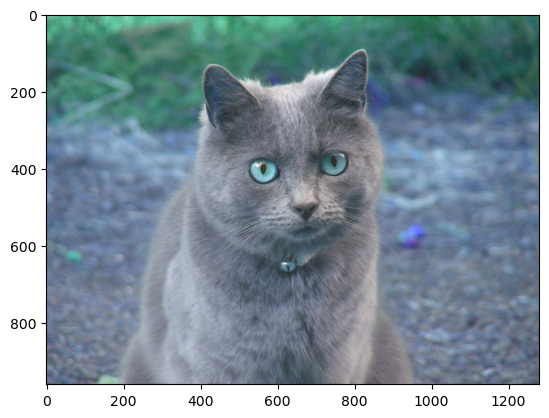

In [20]:
import urllib.request
import cv2

# Public domain image
url = 'https://upload.wikimedia.org/wikipedia/commons/1/15/Greycat.jpg'
urllib.request.urlretrieve(url, 'cat.jpg')

cat_image = cv2.imread('cat.jpg')
plt.imshow(cat_image)

In [21]:
cat_image_expanded = np.expand_dims(cat_image, axis=0)

cat_datagen = ImageDataGenerator(rescale=1./255, 
        rotation_range=20,
        zoom_range=0.15,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.15,
        horizontal_flip=True,
        fill_mode="nearest")

cat_generator = cat_datagen.flow(cat_image_expanded, batch_size=25)

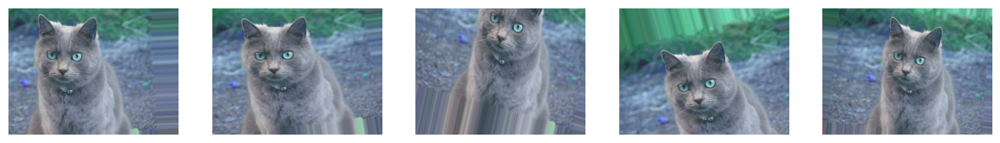

In [22]:
fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(15,5))

for i in range(5):
    image = next(cat_generator)[0]
    ax[i].imshow(image)
    ax[i].axis('off')

In [23]:
def build_model():
    model = keras.models.Sequential([
        keras.layers.Conv2D(64, 3, activation='relu', padding='same', input_shape=[150, 150, 3]),
        keras.layers.Conv2D(64, 3, activation='relu', padding='same'),
        keras.layers.MaxPooling2D((2, 2), (2, 2)),
        keras.layers.BatchNormalization(),

        keras.layers.Conv2D(128, 3, activation='relu', padding='same'),
        keras.layers.Conv2D(128, 3, activation='relu', padding='same'),
        keras.layers.MaxPooling2D((2, 2), (2, 2)),
        keras.layers.BatchNormalization(),

        keras.layers.Conv2D(256, 3, activation='relu', padding='same'),
        keras.layers.Conv2D(256, 3, activation='relu', padding='same'),
        keras.layers.MaxPooling2D((2, 2), (2, 2)),
        keras.layers.BatchNormalization(),

        keras.layers.Flatten(),    
        keras.layers.Dense(64, activation='relu'),
        keras.layers.BatchNormalization(),
        keras.layers.Dropout(0.3, seed=2),
        keras.layers.Dense(6, activation='softmax')
    ])
    
    model.compile(loss="categorical_crossentropy",
              optimizer=keras.optimizers.Adam(),
              metrics=['accuracy',
                       keras.metrics.TopKCategoricalAccuracy(k=2)])
    
    return model

In [25]:
model_static = build_model()
model_static.summary()

callbacks = [
    tf.keras.callbacks.ModelCheckpoint(filepath='intel-classification_staticlr.h5', save_best_only=True),
    tf.keras.callbacks.ReduceLROnPlateau(),
]

history = model_static.fit(train_generator,
                    validation_data = valid_generator,
                    callbacks = callbacks,
                    epochs = 1)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 150, 150, 64)      1792      
                                                                 
 conv2d_7 (Conv2D)           (None, 150, 150, 64)      36928     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 75, 75, 64)       0         
 2D)                                                             
                                                                 
 batch_normalization_4 (Batc  (None, 75, 75, 64)       256       
 hNormalization)                                                 
                                                                 
 conv2d_8 (Conv2D)           (None, 75, 75, 128)       73856     
                                                                 
 conv2d_9 (Conv2D)           (None, 75, 75, 128)      

KeyboardInterrupt: 

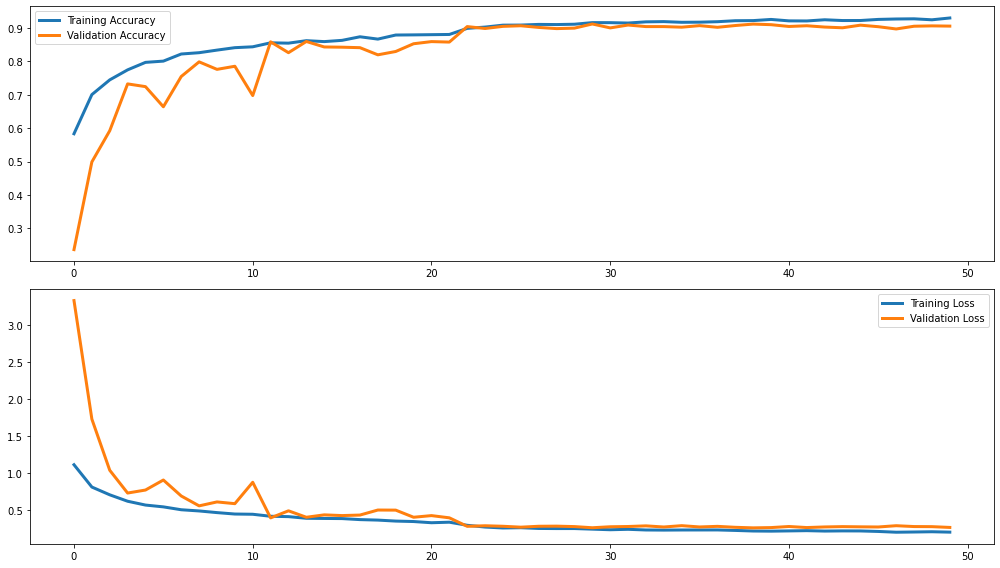

In [22]:
acc, val_acc = history.history['accuracy'], history.history['val_accuracy']
loss, val_loss = history.history['loss'], history.history['val_loss']

fig, ax = plt.subplots(1, 2, figsize=(16, 4))

ax[0].plot(acc, label='Accuracy')
ax[0].plot(val_acc, label='Validation Accuracy')
ax[0].grid(axis='y', linestyle='--')

ax[1].plot(loss, label='Loss')
ax[1].plot(val_loss, label='Validation Loss')
ax[1].grid(axis='y', linestyle='--')

ax[0].legend()
ax[1].legend()
plt.show()

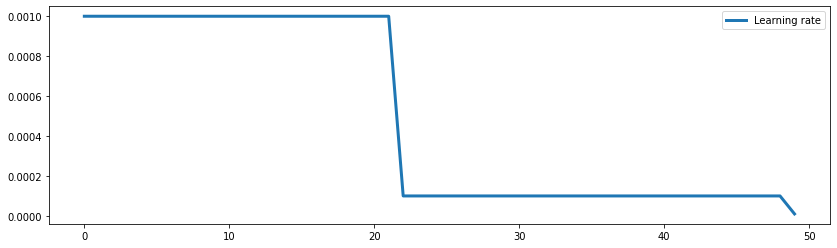

In [23]:
lr = history.history['accuracy'], history.history['val_accuracy']
fig, ax = plt.subplots(figsize=(8, 4))

ax.plot(lr, label='Learning Rate')
ax.grid(axis='y', linestyle='--')
ax.legend()

plt.show()

In [24]:
model_static.evaluate(test_generator)

94/94 [==============================] - 6s 67ms/step - loss: 0.2674 - accuracy: 0.9137 - top_k_categorical_accuracy: 0.9847


[0.26743531227111816, 0.9136666655540466, 0.984666645526886]

In [25]:
from keraslrfinder import LearningRateFinder

model_lrfind = build_model()

lr_finder = LearningRateFinder(model_lrfind, beta=0.7)
lr_finder.find(train_generator, startLR=1e-10, endLR=10, epochs=3, stepsPerEpoch=np.ceil((len(train_generator.classes) / float(32))))

Epoch 1/3
351/351 [==============================] - 51s 144ms/step - loss: 2.4664 - accuracy: 0.1880 - top_k_categorical_accuracy: 0.3728
Epoch 2/3
351/351 [==============================] - 51s 144ms/step - loss: 1.5788 - accuracy: 0.4476 - top_k_categorical_accuracy: 0.6654
Epoch 3/3
351/351 [==============================] - 36s 103ms/step - loss: 5.4142 - accuracy: 0.4768 - top_k_categorical_accuracy: 0.7083


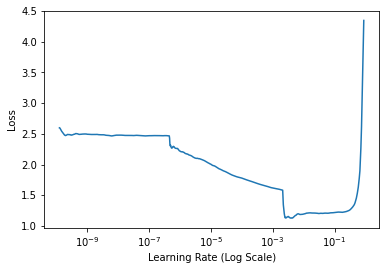

In [26]:
lr_finder.plot_loss()

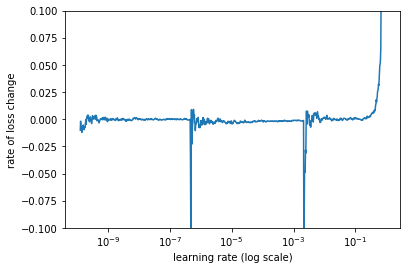

In [27]:
lr_finder.plot_loss_change(sma=1, y_lim=(-0.1, 0.1))

In [28]:
lr_finder.get_best_lr(sma=1)

0.002154435

In [29]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    lr_finder.get_best_lr(sma=1),
    decay_steps=5*(len(train_generator.classes) / 32),
    decay_rate=0.83,
    staircase=True)

In [30]:
model_lr = build_model()

In [31]:
model_lr.compile(loss="categorical_crossentropy",
              optimizer=keras.optimizers.Adam(learning_rate=lr_schedule),
              metrics=['accuracy',
                       keras.metrics.TopKCategoricalAccuracy(k=2)])

In [32]:
callbacks = [
    tf.keras.callbacks.ModelCheckpoint(filepath='intel-classification_lrfinderandschedule.h5', save_best_only=True),    
]

history = model_lr.fit(train_generator,
                    validation_data = valid_generator,
                    callbacks = callbacks,
                    epochs = 50)

Epoch 1/50
351/351 [==============================] - 62s 175ms/step - loss: 1.1737 - accuracy: 0.5509 - top_k_categorical_accuracy: 0.7837 - val_loss: 1.4801 - val_accuracy: 0.4265 - val_top_k_categorical_accuracy: 0.6341
Epoch 2/50
351/351 [==============================] - 62s 175ms/step - loss: 0.8896 - accuracy: 0.6595 - top_k_categorical_accuracy: 0.8623 - val_loss: 1.9676 - val_accuracy: 0.3884 - val_top_k_categorical_accuracy: 0.6416
Epoch 3/50
351/351 [==============================] - 62s 175ms/step - loss: 0.7531 - accuracy: 0.7191 - top_k_categorical_accuracy: 0.9002 - val_loss: 0.8847 - val_accuracy: 0.6755 - val_top_k_categorical_accuracy: 0.8670
Epoch 4/50
351/351 [==============================] - 62s 175ms/step - loss: 0.6807 - accuracy: 0.7509 - top_k_categorical_accuracy: 0.9159 - val_loss: 0.7011 - val_accuracy: 0.7364 - val_top_k_categorical_accuracy: 0.9133
Epoch 5/50
351/351 [==============================] - 62s 175ms/step - loss: 0.6309 - accuracy: 0.7720 - top

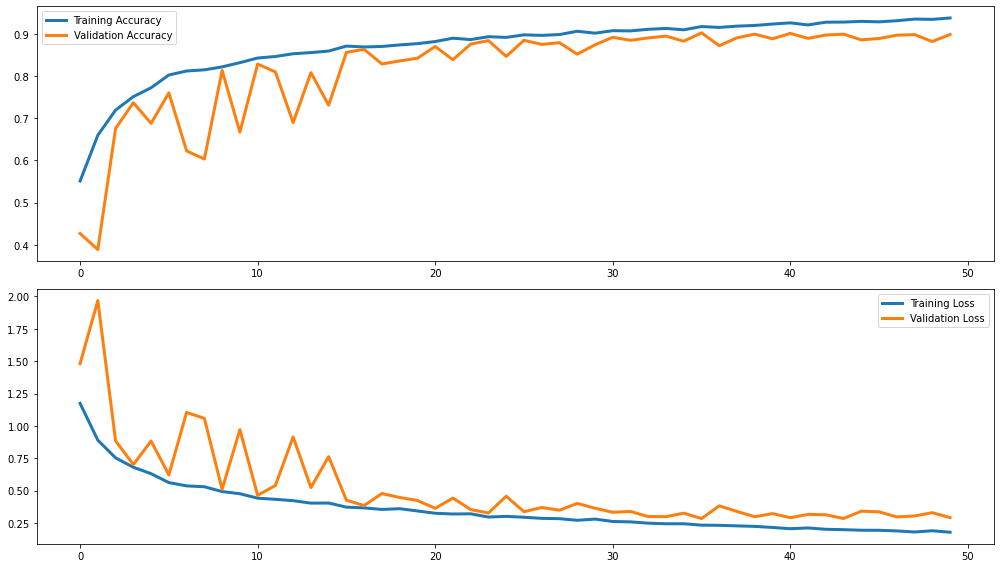

In [33]:
acc, val_acc = history.history['accuracy'], history.history['val_accuracy']
loss, val_loss = history.history['loss'], history.history['val_loss']

fig, ax = plt.subplots(1, 2, figsize=(16, 4))

ax[0].plot(acc, label='Accuracy')
ax[0].plot(val_acc, label='Validation Accuracy')

ax[0].grid(axis='y', linestyle='--')

ax[1].plot(loss, label='Loss')
ax[1].plot(val_loss, label='Validation Loss')
ax[1].grid(axis='y', linestyle='--')

ax[0].legend()
ax[1].legend()
plt.show()

In [34]:
model_lr.evaluate(test_generator)

94/94 [==============================] - 4s 42ms/step - loss: 0.3219 - accuracy: 0.8960 - top_k_categorical_accuracy: 0.9787


[0.32186445593833923, 0.8960000276565552, 0.9786666631698608]

In [35]:
from sklearn import metrics

y_pred1 = model_static.predict(test_generator)
y_pred2 = model_lr.predict(test_generator)

In [36]:
np.argmax(y_pred1[0])

0

In [37]:
test_generator.classes[0]

0

In [38]:
print('Base-Keras' + metrics.classification_report(test_generator.classes, np.argmax(y_pred1, axis=1)))
print('LRFinder ' + metrics.classification_report(test_generator.classes, np.argmax(y_pred2, axis=1)))

Base-Keras              precision    recall  f1-score   support

           0       0.87      0.92      0.90       437
           1       0.97      0.99      0.98       474
           2       0.90      0.87      0.88       553
           3       0.88      0.86      0.87       525
           4       0.93      0.95      0.94       510
           5       0.93      0.91      0.92       501

    accuracy                           0.91      3000
   macro avg       0.91      0.92      0.91      3000
weighted avg       0.91      0.91      0.91      3000

LRFinder               precision    recall  f1-score   support

           0       0.81      0.95      0.87       437
           1       0.98      0.98      0.98       474
           2       0.86      0.85      0.86       553
           3       0.86      0.82      0.84       525
           4       0.93      0.94      0.94       510
           5       0.94      0.85      0.90       501

    accuracy                           0.90      3000
   m

In [39]:
model = keras.models.load_model('intel-classification_staticlr.h5')

In [40]:
y_preds = model.predict(test_generator)

In [41]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

In [42]:
matrix = confusion_matrix(test_generator.classes, y_preds.argmax(axis=1))

[Text(0, 0.5, 'buildings'),
 Text(0, 1.5, 'forest'),
 Text(0, 2.5, 'glacier'),
 Text(0, 3.5, 'mountain'),
 Text(0, 4.5, 'sea'),
 Text(0, 5.5, 'street')]

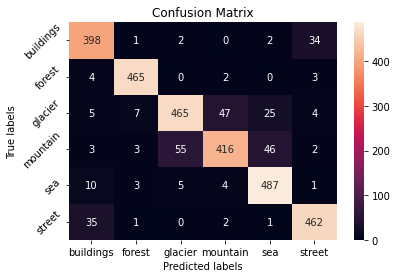

In [43]:
fig, ax = plt.subplots()

sns.heatmap(matrix, ax=ax, fmt='g',  annot=True)

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix');

ax.xaxis.set_ticklabels(classnames)
ax.yaxis.set_ticklabels(classnames, rotation=45)

In [44]:
test_generator = test_datagen.flow_from_directory(config['TEST_PATH'],
                                                 target_size=(150,150),
                                                 batch_size=32,
                                                 shuffle=True,
                                                 class_mode='categorical',
                                                 seed=2)

Found 3000 images belonging to 6 classes.


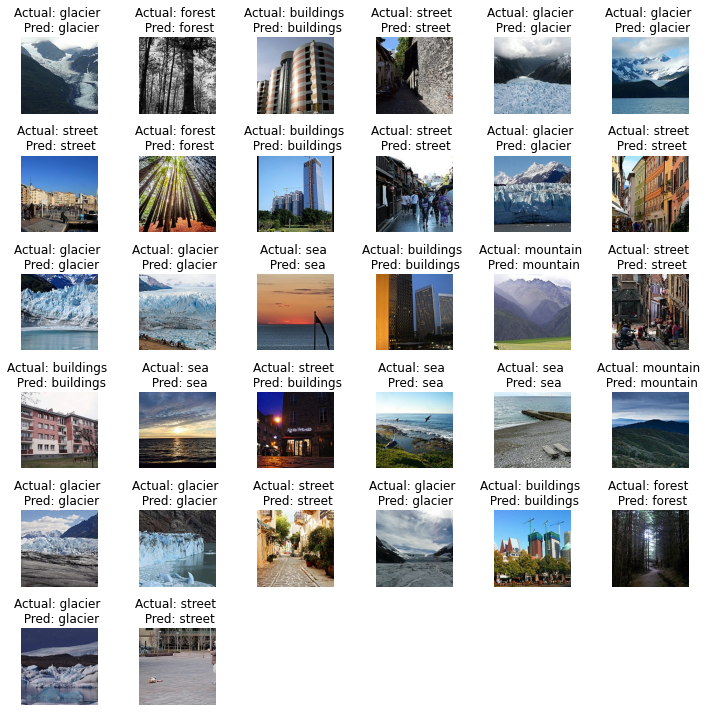

In [45]:
batch = next(test_generator)

images = batch[0]
labels = batch[1]

fig = plt.figure(figsize=(10, 10))

for index, image in enumerate(images):
    ax = fig.add_subplot(6, 6, index+1)
    plt.imshow(image)
    
    image = np.expand_dims(image, 0)
    pred = model.predict(image)
    pred = np.squeeze(pred)
    
    ax.set_title(f'Actual: {classnames[np.argmax(labels[index])]} \n Pred: {classnames[np.argmax(pred)]}')
    ax.axis('off')
    
plt.tight_layout()
plt.show()

In [46]:
test_generator = test_datagen.flow_from_directory(config['TEST_PATH'],
                                                 target_size=(150,150),
                                                 batch_size=32,
                                                 shuffle=False,
                                                 class_mode='categorical',
                                                 seed=2)

y_preds = model.predict(test_generator)

Found 3000 images belonging to 6 classes.


In [47]:
test_generator.classes

array([0, 0, 0, ..., 5, 5, 5])

In [48]:
y_pred_classes = np.argmax(y_preds, axis=1)
y_pred_classes

array([0, 0, 0, ..., 3, 0, 5], dtype=int64)

In [49]:
test_generator.classes != y_pred_classes

array([False, False, False, ...,  True,  True, False])

In [50]:
wrong_preds_indices = np.where(test_generator.classes != y_pred_classes)
wrong_preds_indices[0][:10]

array([  5,  22,  25,  30,  53,  59,  79,  86,  88, 119], dtype=int64)

In [51]:
wrong_pred_paths = np.take(test_generator.filenames, wrong_preds_indices[0])

In [52]:
wrong_pred_paths

array(['buildings\\20074.jpg', 'buildings\\20246.jpg',
       'buildings\\20294.jpg', 'buildings\\20374.jpg',
       'buildings\\20581.jpg', 'buildings\\20628.jpg',
       'buildings\\20771.jpg', 'buildings\\20826.jpg',
       'buildings\\20846.jpg', 'buildings\\21203.jpg',
       'buildings\\21501.jpg', 'buildings\\21506.jpg',
       'buildings\\21580.jpg', 'buildings\\21929.jpg',
       'buildings\\22031.jpg', 'buildings\\22266.jpg',
       'buildings\\22421.jpg', 'buildings\\22426.jpg',
       'buildings\\22534.jpg', 'buildings\\22596.jpg',
       'buildings\\22598.jpg', 'buildings\\22741.jpg',
       'buildings\\22951.jpg', 'buildings\\23009.jpg',
       'buildings\\23144.jpg', 'buildings\\23304.jpg',
       'buildings\\23405.jpg', 'buildings\\23475.jpg',
       'buildings\\23542.jpg', 'buildings\\23594.jpg',
       'buildings\\23635.jpg', 'buildings\\23660.jpg',
       'buildings\\23727.jpg', 'buildings\\23733.jpg',
       'buildings\\23854.jpg', 'buildings\\24153.jpg',
       'bu

In [53]:
import cv2

img = cv2.imread(config['TEST_PATH']+wrong_pred_paths[12])
img = cv2.resize(img, (150,150))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = img/255

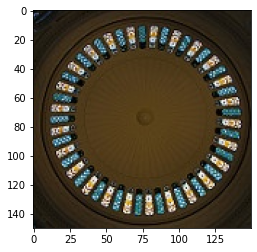

In [54]:
plt.imshow(img)

In [55]:
pred = model.predict(np.expand_dims(img, 0))

In [56]:
classnames[pred.argmax()]

'street'

In [57]:
import cv2

miss_imgs = []
actual_labels = []
preds = []

for wrong_pred_path in wrong_pred_paths:
    img = cv2.imread(config['TEST_PATH']+wrong_pred_path)
    img = cv2.resize(img, (150,150))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img/255
    
    miss_imgs.append(img)
    pred = model.predict(np.expand_dims(img, 0))
    preds.append(np.argmax(pred))
    actual_labels.append(wrong_pred_path.split('\\')[0])

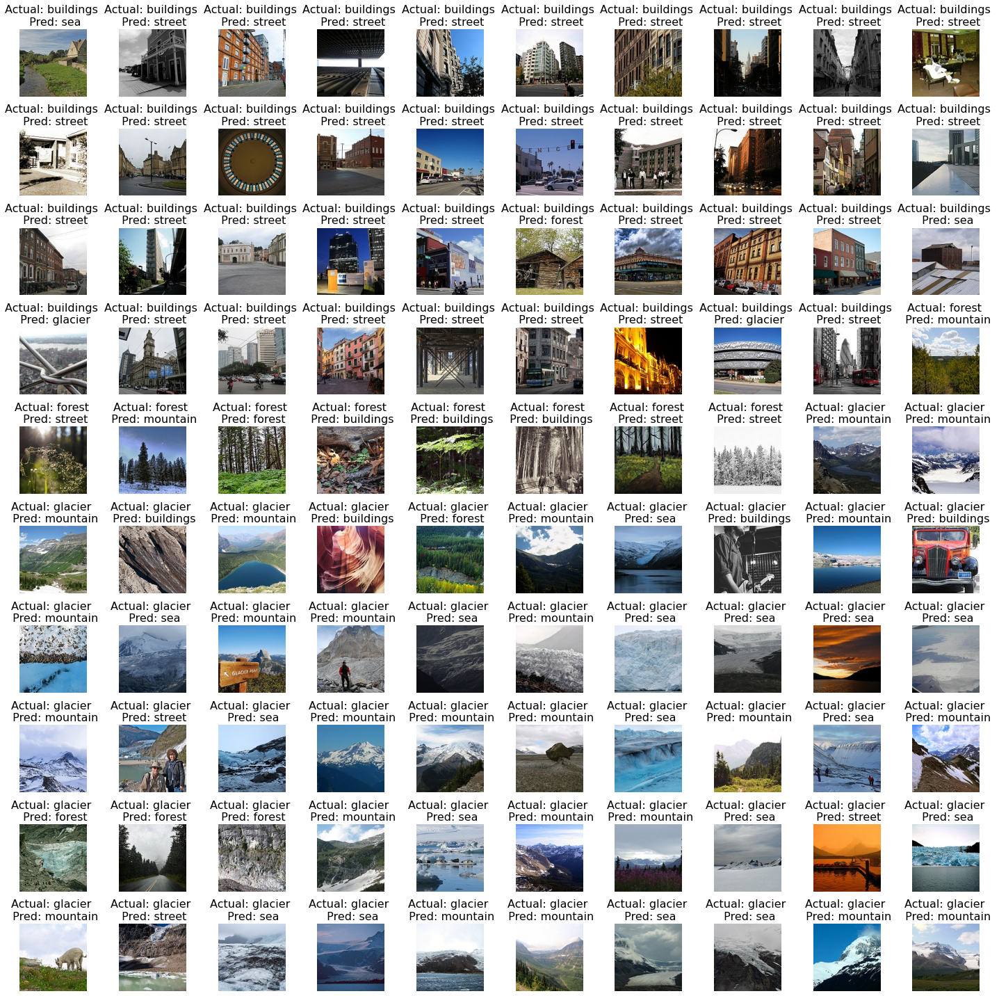

In [58]:
subset = miss_imgs[:100]
fig = plt.figure(figsize=(20, 20))

for index, img in enumerate(subset):
    ax = fig.add_subplot(10, 10, index+1)
    ax.imshow(img)
    ax.set_title(f'Actual: {actual_labels[index]} \n Pred: {classnames[preds[index]]}', fontsize=16)
    ax.axis('off')
        
plt.tight_layout()
plt.show()

In [59]:
subset_series = pd.Series(subset)
actual_labels_series = pd.Series(actual_labels)
preds_series = pd.Series(preds)

example_indices = [2, 3, 6, 7, 8, 9, 10, 11, 26, 29, 30, 36, 44, 45, 49, 51, 75, 79, 90, 99]

example_imgs = subset_series[example_indices]
example_labels = actual_labels_series[example_indices]
example_preds = preds_series[example_indices]

example_imgs = list(example_imgs)
example_labels = list(example_labels)
example_preds = list(example_preds)

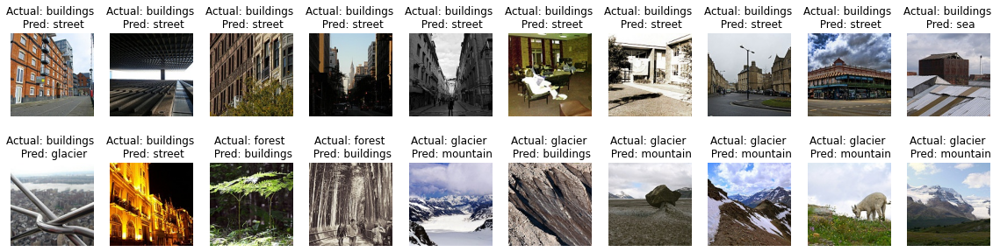

In [60]:
fig = plt.figure(figsize=(20, 5))

for index, img in enumerate(example_imgs):
    ax = fig.add_subplot(2, 10, index+1)
    ax.imshow(img)
    ax.set_title(f'Actual: {example_labels[index]} \n Pred: {classnames[example_preds[index]]}')
    ax.axis('off')
        
plt.show()

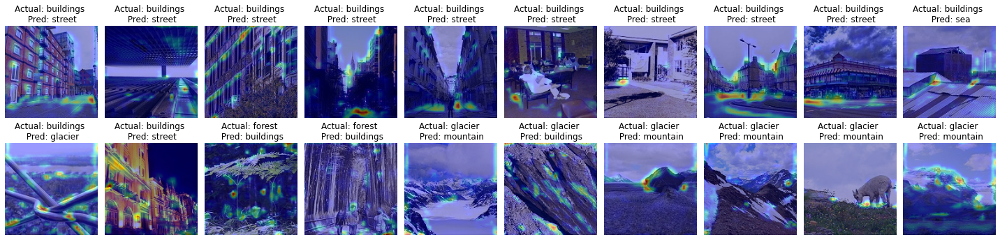

In [61]:
from matplotlib import cm
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore

gradcam = GradcamPlusPlus(model,
                          model_modifier=ReplaceToLinear(),
                          clone=True)

fig = plt.figure(figsize=(20, 5))

for index, img in enumerate(example_imgs):
    ax = fig.add_subplot(2, 10, index+1)
    
    cam = gradcam(CategoricalScore(5), img)
    heatmap = np.uint8(cm.jet(cam[0])[..., :3] * 255)
    
    ax.imshow(img)
    ax.imshow(heatmap, cmap='jet', alpha=0.4) # overlay
    ax.set_title(f'Actual: {example_labels[index]} \n Pred: {classnames[example_preds[index]]}')
    ax.axis('off')
        
plt.tight_layout()
plt.show()

In [62]:
from glob import glob

def read_images(train_path, test_path, pred_path):
    paths = [train_path, test_path, pred_path]
    
    sets = []
    
    for path in paths:
        images = []
        labels = []
        print(f'Loading images from: {path}')
        data = glob(f'{path}/*/*', recursive=True)
        for img_path in data:
            label = img_path.split('\\')[1]
            numerical_label = classnames.index(label)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (150, 150))
            labels.append(numerical_label)
            images.append(img)
        images = np.array(images, dtype='float32')
        labels = np.array(labels, dtype='float32')
        images=images/255
        
        sets.append((images, labels))
    return sets
        
        
#(x_train, y_train), (x_test, y_test), _ = read_images(config['TRAIN_PATH'], config['TEST_PATH'], config['PRED_PATH'])

In [63]:
model_trunc = keras.Sequential()

for layer in model.layers[:-5]:
    model_trunc.add(layer)
    
model_trunc.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 150, 150, 64)      1792      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 150, 150, 64)      36928     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 75, 75, 64)        0         
_________________________________________________________________
batch_normalization (BatchNo (None, 75, 75, 64)        256       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 75, 75, 128)       73856     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 75, 75, 128)       147584    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 37, 37, 128)       0

In [64]:
features = model_trunc.predict(test_generator)
features.shape

(3000, 18, 18, 256)

In [65]:
features = features.reshape(len(features), -1)
features

array([[-0.2074167 ,  0.5661891 , -0.02862557, ..., -0.7675068 ,
        -0.07422262, -0.13346325],
       [-0.2074167 ,  0.13820972, -0.02862557, ...,  1.0467052 ,
        -0.07422262, -0.13346325],
       [-0.2074167 ,  3.176385  , -0.02862557, ..., -0.04700703,
        -0.07422262,  0.93847835],
       ...,
       [-0.2074167 , -0.17508143, -0.02862557, ...,  1.3590186 ,
        -0.07422262, -0.13346325],
       [-0.2074167 , -0.17508143, -0.02862557, ..., -0.14311774,
        -0.07422262, -0.13346325],
       [-0.2074167 , -0.17508143, -0.02862557, ..., -0.1684054 ,
         1.7690991 , -0.13346325]], dtype=float32)

In [66]:
features.shape

(3000, 82944)

In [67]:
filenames = test_generator.filenames
class_ids = test_generator.classes

In [68]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)

features_pca = pca.fit_transform(features)

In [69]:
f_pca_component1 = features_pca[:,0]
f_pca_component2 = features_pca[:,1]

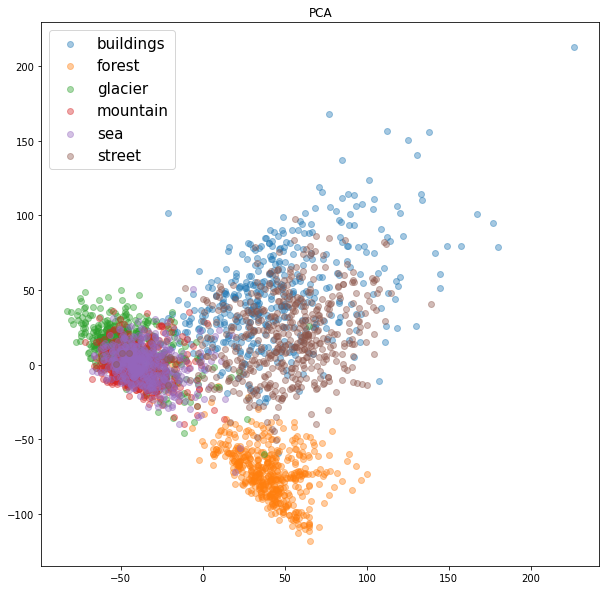

In [70]:
plt.subplots(figsize=(10,10))

for class_id, classname in enumerate(classnames):
    plt.scatter(f_pca_component1[test_generator.classes == class_id], 
                f_pca_component2[test_generator.classes == class_id], 
                label = classname, 
                alpha=0.4)
    
plt.legend(prop={"size": 15})
plt.title("PCA")
plt.show()

In [71]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)

features_pca_3d = pca.fit_transform(features)

In [72]:
f_pca_component1 = features_pca_3d[:,0]
f_pca_component2 = features_pca_3d[:,1]
f_pca_component3 = features_pca_3d[:,2]

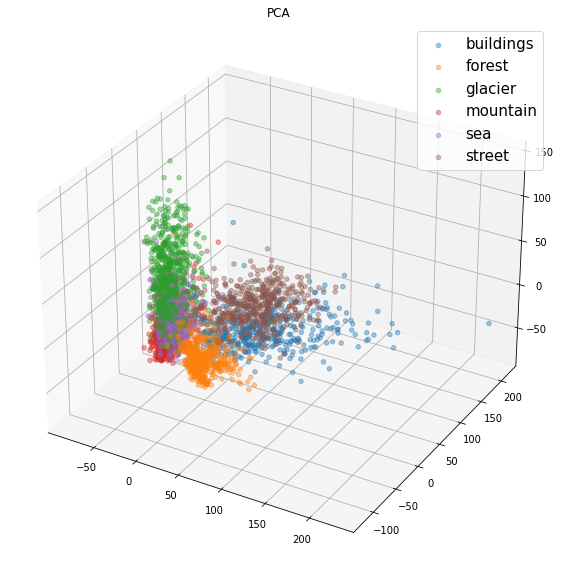

In [73]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10,10))

ax = fig.add_subplot(111, projection = '3d')

for class_id, classname in enumerate(classnames):
    ax.scatter(f_pca_component1[test_generator.classes == class_id], 
                f_pca_component2[test_generator.classes == class_id], 
                f_pca_component3[test_generator.classes == class_id],
                label = classname, 
                alpha=0.4)
    
plt.legend(prop={"size": 15})
plt.title("PCA")
plt.show()

In [74]:
from sklearn.manifold import TSNE
tsne_results = TSNE(n_components=2,
                    verbose=1,
                    perplexity=75,
                    n_iter=1000,
                    random_state=2,
                    metric='euclidean').fit_transform(features_pca)

[t-SNE] Computing 226 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.002s...
[t-SNE] Computed neighbors for 3000 samples in 0.087s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 4.383511
[t-SNE] KL divergence after 250 iterations with early exaggeration: 56.937721
[t-SNE] KL divergence after 1000 iterations: 0.454532


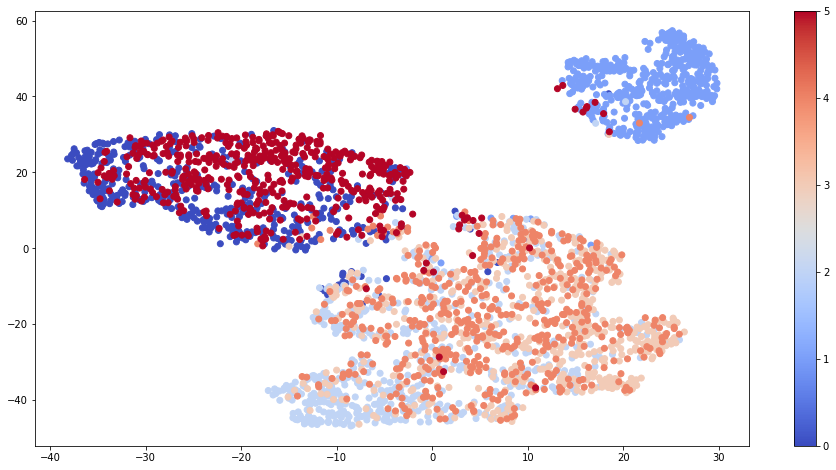

In [75]:
fig, ax = plt.subplots(figsize=(16, 8))

scatter_plot = ax.scatter(tsne_results[:, 0],
                           tsne_results[:, 1],
                           c=class_ids,
                           cmap='coolwarm')
plt.colorbar(scatter_plot)
plt.show()

In [76]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

def plot_images_in_2d(x, y, image_paths, axis=None, zoom=1):
    axis = plt.gca()
    for x0, y0, image_path in zip(x, y, image_paths):
        image = cv2.imread(config['TEST_PATH']+image_path)
        image = cv2.resize(image, (100, 100))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        img = OffsetImage(image, zoom=zoom)
        anno_box = AnnotationBbox(img, (x0, y0),
                                  xycoords='data',
                                  frameon=False)
        # Adds annotation box (image) to the axis
        # *Note:* requires updating data limits and autoscaling
        axis.add_artist(anno_box)
    axis.update_datalim(np.column_stack([x, y]))
    axis.autoscale()

In [77]:
def show_tsne(x, y, filenames):
    fig, axis = plt.subplots(figsize=(20, 20))
    plot_images_in_2d(x, y, filenames, zoom=0.25, axis=axis)
    plt.show()

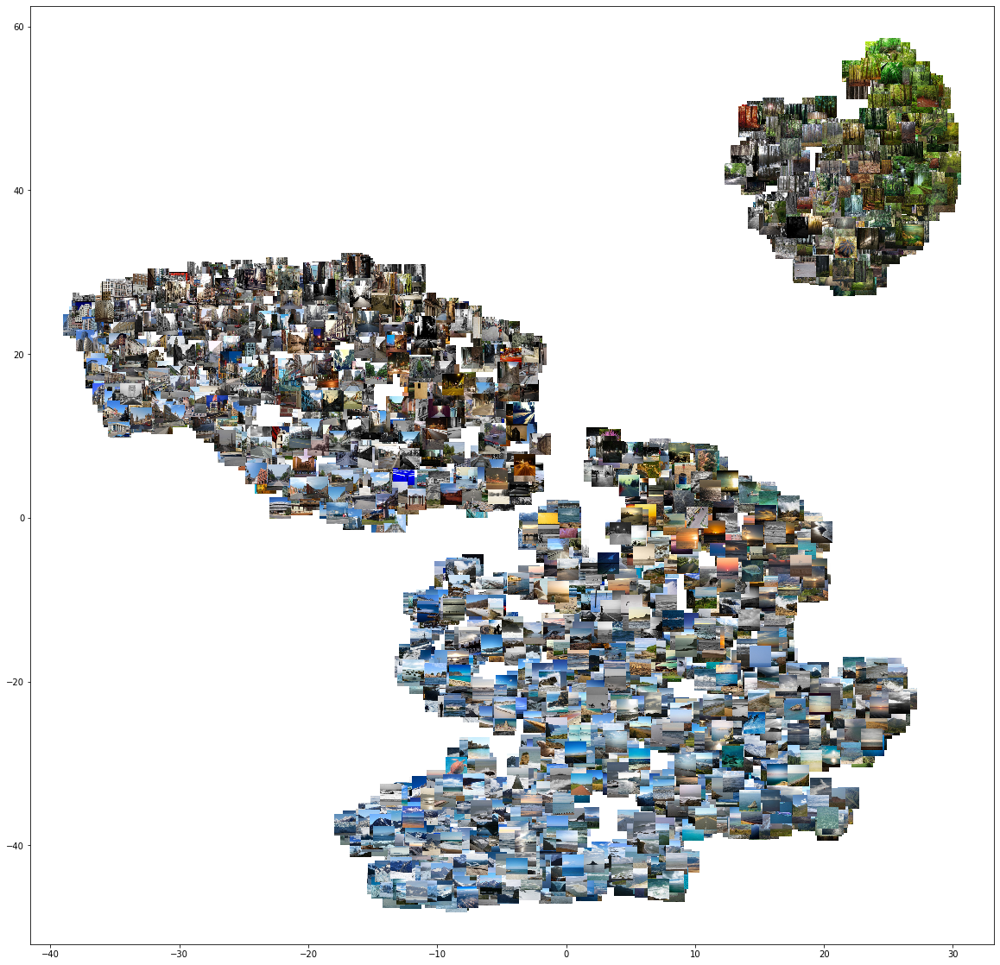

In [78]:
show_tsne(tsne_results[:, 0], tsne_results[:, 1], filenames)